In [ ]:
from PIL import Image
import os
import shutil
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D, BatchNormalization, Flatten, Dense, Dropout)
from mlxtend.plotting import plot_confusion_matrix
from tensorflow.keras.utils import to_categorical, plot_model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import warnings

2025-04-02 16:20:22.535253: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
path='/Users/gamalielmarines/Downloads/CNN-Reto-Benji/ALL Image Dataset/Original'
pd.DataFrame(os.listdir(path),columns=['Files'])

,Files
0,Early
1,.DS_Store
2,Pro
3,Benign
4,Pre


In [3]:
train_data_dir =path
batch_size = 32
target_size = (224, 224)

# Set split ratios for train, validation, and test
train_split = 0.7  # 70% for training
val_split = 0.15   # 15% for validation
test_split = 0.15  # 15% for test

# Train set
train = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=(1 - train_split),  # 30% reserved for validation+test
    subset="training",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)

# Validation and Test set (split from the remaining 30%)
validation = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=val_split / (val_split + test_split),  # 50% of the remaining 30% (i.e., 15%)
    subset="validation",
    seed=44,
    image_size=target_size,
    batch_size=batch_size,
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=val_split / (val_split + test_split),  # 50% of the remaining 30% (i.e., 15%)
    subset="validation",
    seed=100,
    image_size=target_size,
    batch_size=batch_size,
)

Found 3256 files belonging to 4 classes.
Using 2280 files for training.
Found 3256 files belonging to 4 classes.
Using 1628 files for validation.
Found 3256 files belonging to 4 classes.
Using 1628 files for validation.


In [4]:
class_names = train.class_names
print("Class Names:", class_names)

Class Names: ['Benign', 'Early', 'Pre', 'Pro']


2025-04-02 16:22:18.521618: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-02 16:22:19.376401: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-02 16:22:20.088329: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-02 16:22:20.674295: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-02 16:22:21.018907: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-02 16:22:21.352812: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


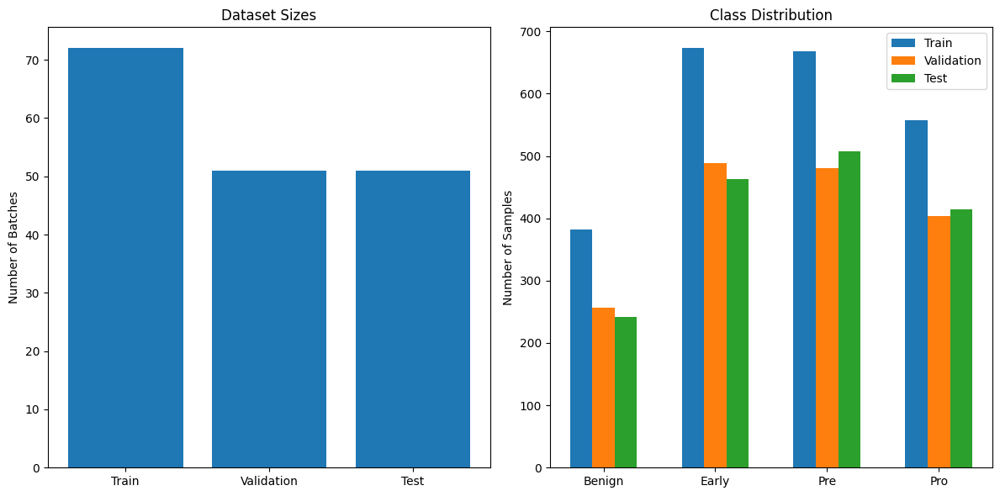

In [5]:
# Get the sizes of the datasets
train_size = len(list(train))
val_size = len(list(validation))
test_size = len(list(test))

# Get the class distribution in each dataset
train_class_counts = np.zeros(len(class_names))
val_class_counts = np.zeros(len(class_names))
test_class_counts = np.zeros(len(class_names))

for images, labels in train:
    for label in labels.numpy():
        train_class_counts[label] += 1

for images, labels in validation:
    for label in labels.numpy():
        val_class_counts[label] += 1

for images, labels in test:
    for label in labels.numpy():
        test_class_counts[label] += 1

# Plot the sizes of the datasets
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.bar(['Train', 'Validation', 'Test'], [train_size, val_size, test_size])
plt.title('Dataset Sizes')
plt.ylabel('Number of Batches')

# Plot the class distribution in each dataset
x = np.arange(len(class_names))
width = 0.2

plt.subplot(1, 2, 2)
plt.bar(x - width, train_class_counts, width, label='Train')
plt.bar(x, val_class_counts, width, label='Validation')
plt.bar(x + width, test_class_counts, width, label='Test')
plt.xticks(x, class_names)
plt.title('Class Distribution')
plt.ylabel('Number of Samples')
plt.legend()

plt.tight_layout()
plt.show()

2025-04-02 16:22:58.961741: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


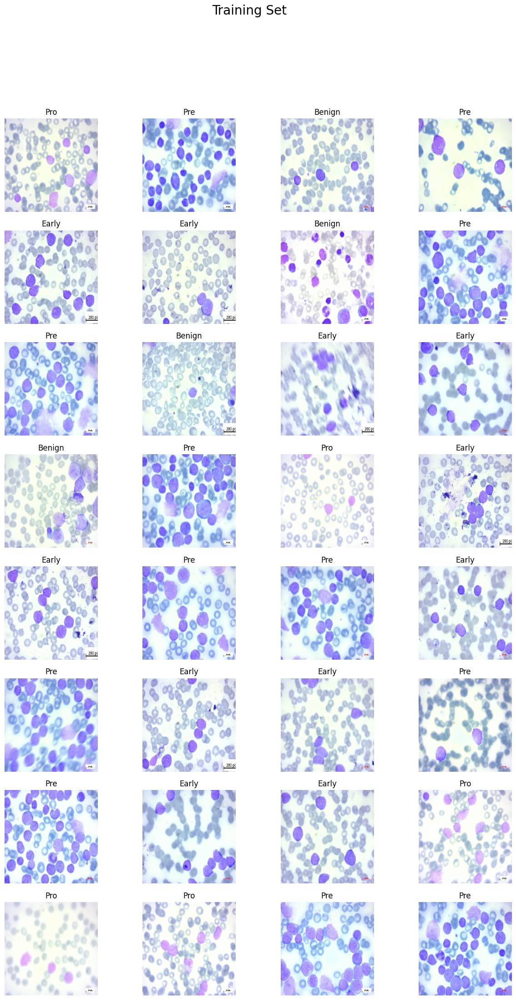

2025-04-02 16:23:02.803755: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


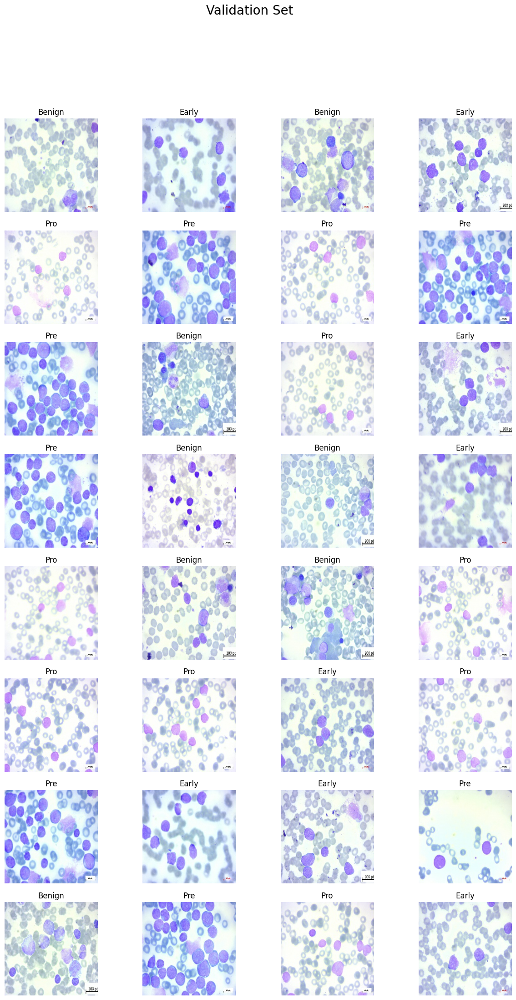

2025-04-02 16:23:07.244541: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


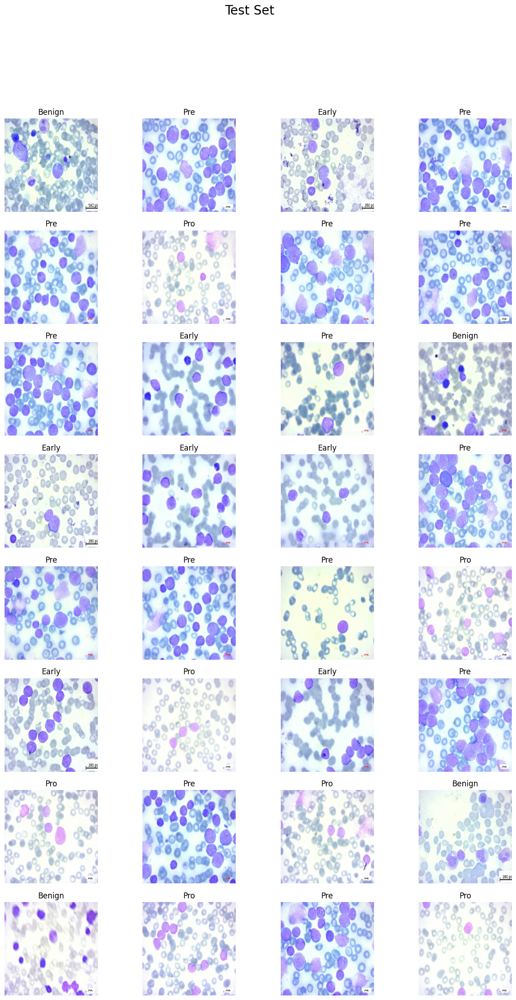

In [6]:
def plot_dataset(dataset, title):
    plt.figure(figsize=(15, 25))
    for images, labels in dataset.take(1):
        for i in range(32):
            ax = plt.subplot(8, 4, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[labels[i]])
            plt.axis("off")
    plt.suptitle(title, fontsize=20)
    plt.show()

# Plot training set
plot_dataset(train, "Training Set")

# Plot validation set
plot_dataset(validation, "Validation Set")

# Plot test set
plot_dataset(test, "Test Set")

In [7]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


In [8]:
from tensorflow.keras.applications import ResNet50
from tensorflow import keras

base_model = ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='/Users/gamalielmarines/Downloads/CNN-Reto-Benji/ResNet50 Weights.h5'
)

base_model.trainable = False

model = keras.models.Sequential([
    base_model,
    keras.layers.Flatten(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4, activation='softmax')
])

model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

model.build((None, 224, 224, 3))

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │       401,412 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,989,124 (91.51 MB)

 Trainable params: 401,412 (1.53 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [9]:
checkpoint_cb = ModelCheckpoint("restnet_model.keras", save_best_only=True)
early_stopping_cb = EarlyStopping(patience=2, restore_best_weights=True)

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

hist = model.fit(
    train,
    epochs=3,
    validation_data=validation,
    callbacks=[checkpoint_cb]
)


Epoch 1/3
72/72 ━━━━━━━━━━━━━━━━━━━━ 242s 3s/step - accuracy: 0.6330 - loss: 8.1465 - val_accuracy: 0.9699 - val_loss: 0.2152
Epoch 2/3
72/72 ━━━━━━━━━━━━━━━━━━━━ 231s 3s/step - accuracy: 0.9681 - loss: 0.2105 - val_accuracy: 0.9570 - val_loss: 0.2540
Epoch 3/3
72/72 ━━━━━━━━━━━━━━━━━━━━ 233s 3s/step - accuracy: 0.9843 - loss: 0.0674 - val_accuracy: 0.9920 - val_loss: 0.0556


In [11]:
score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

51/51 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.9900 - loss: 0.1044
Test Loss = 0.055647097527980804
Test Accuracy = 0.9920147657394409


In [12]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.814912,3.511461,0.969902,0.215178
1,0.970614,0.167510,0.957002,0.253984
2,0.985088,0.071792,0.992015,0.055647


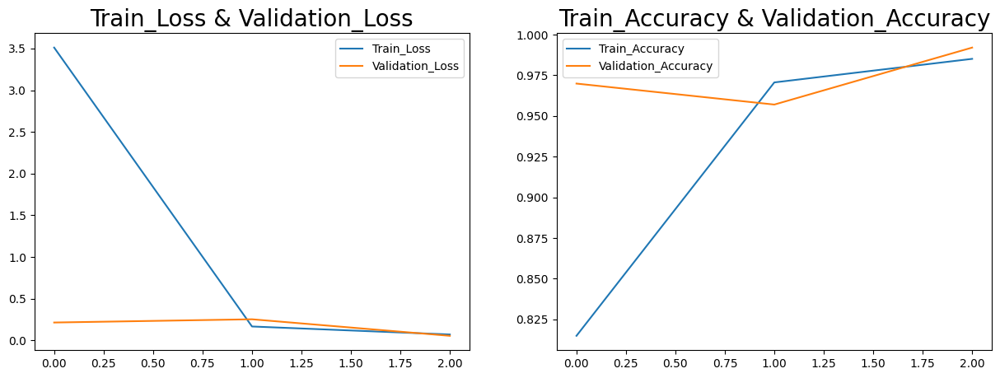

In [13]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [14]:
X_val,y_val,y_pred=[],[],[]
for images, labels in test:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred
df

2025-04-02 16:39:51.925431: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


51/51 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step


,Actual,Prediction
0,3,3
1,0,0
2,3,3
3,1,3
4,0,0
...,...,...
1623,2,2
1624,1,1
1625,3,3
1626,3,3


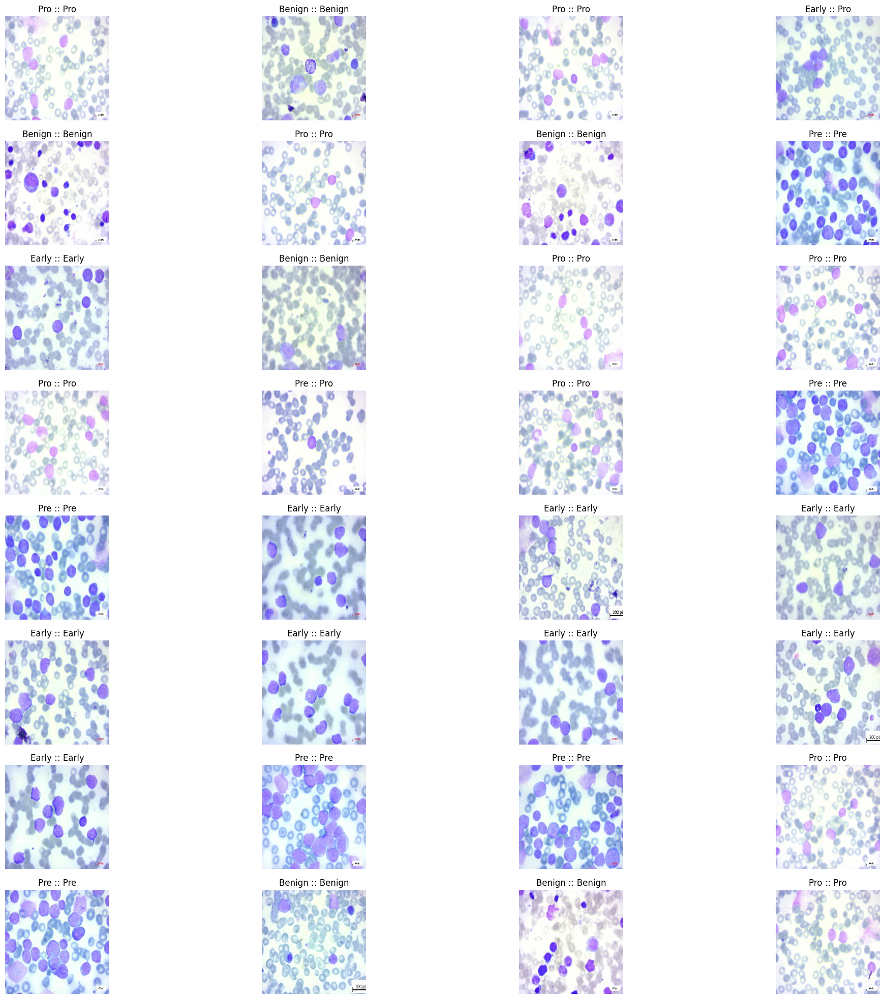

In [15]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

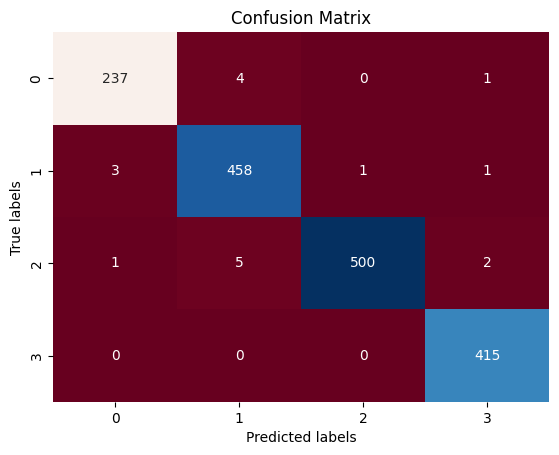

array([[237,   4,   0,   1],
       [  3, 458,   1,   1],
       [  1,   5, 500,   2],
       [  0,   0,   0, 415]])

In [16]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [17]:
ClassificationReport = classification_report(y_val,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.98      0.98      0.98       242
           1       0.98      0.99      0.98       463
           2       1.00      0.98      0.99       508
           3       0.99      1.00      1.00       415

    accuracy                           0.99      1628
   macro avg       0.99      0.99      0.99      1628
weighted avg       0.99      0.99      0.99      1628

